In [1]:
try:
    import google.colab
    google.colab.drive.mount('/content/drive/')
    %cd ../content/drive/Othercomputers/Laptop/Flood_Detection
    !pip install -q pytorch-lightning
    !pip install -q torchview
    !pip install -q umap-learn
except:
    pass

Mounted at /content/drive/
/content/drive/Othercomputers/Laptop/Flood_Detection
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.0/719.0 kB 45.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 56.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 75.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 28.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 21.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 47.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [19]:
import sys; sys.path.append('../../')
from DataPreparation.DataPreparation import read_data
#from FeatureExtraction.Shufflenet.Shufflenet import apply_deep_features
from FeatureExtraction.Visuals import illustrate3DFeatures
import albumentations as A
import albumentations.pytorch as AP

### Data Preparation

In [20]:
more_transforms = [AP.transforms.ToTensorV2()]          # PyTorch deals with tensors on the GPU not numpy arrays
x_train_d, x_val_d, y_train_d, y_val_d = read_data(gray=False, normalize=True, new_size=224, more_transforms=more_transforms, saved=True)

x_train shape:  (737,)
x_val shape:  (185,)


### Feature Extraction

In [25]:
import torchvision.models as models
import torch.nn as nn
import torch
import numpy as np
from tqdm import tqdm
import os
import pytorch_lightning as pl

### collab setup
try:
    import google.colab
    data_loc = '../../../../../MyDrive/SI-Project/'
except:
    data_loc = '../../../' 

class ConvNet(pl.LightningModule):
    '''
    Vision Transformer (ViT) Model
    '''
    def __init__(self):
        super(ConvNet, self).__init__()
        self.model = models.vit_b_16()
        self.model.head = nn.Identity()  # Remove the classification head
        self.model.eval()
        
    def forward(self, x):
        '''
        Forward method to pass a given input batch to the model and return its predictions
        '''
        x = x.unsqueeze(0)
        x = self.model(x)
        return x

model = ConvNet()


def deep_features(img):
    '''
    Produces a feature vector for the image using a pretrained model
    '''
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    img = img.to(device)
    model = ConvNet().to(device)
    model.eval()
    feat = model(img)
    return feat.detach().cpu().numpy()


def save_features(apply_deep_features):
    ''' A decorator to the apply_rand function that extends it so that:
    - it can take x_train and x_val simultaneously
    - it saves the features
    - it can still only take x_test when eval=True
    '''
    def apply_deep_d(x_train, x_val, saved=False, eval=False):
        if eval:
            return apply_deep_features(x_val)
        save_path = './vit.npy'
        if saved:
            with open(save_path, 'rb') as f:
                x_train = np.load(f, allow_pickle=True)
                x_val = np.load(f, allow_pickle=True)
            return x_train, x_val
        else:
            x_train = apply_deep_features(x_train)
            x_val = apply_deep_features(x_val)
            with open(save_path, 'wb') as f:
                np.save(f, x_train, allow_pickle=True)
                np.save(f, x_val, allow_pickle=True)
            return x_train, x_val
    return apply_deep_d


@save_features
def apply_deep_features(x_data):
    '''
    Simply applies the deep_feature function to each image in x_data
    '''
    x_data_f = []
    for x in tqdm(x_data):
        feat = deep_features(x)
        feat = np.squeeze(feat)
        x_data_f.append(feat)
    return np.array(x_data_f)


In [ ]:
x_train_d, x_val_d = apply_deep_features(x_train_d, x_val_d, saved=False)

 89%|████████▉ | 656/737 [12:29<01:23,  1.03s/it]

In [ ]:
import pytorch_lightning as pl
import torchvision.models as models
import torch.nn as nn
import torch
import numpy as np
from tqdm import tqdm
import os
### collab setup
try:
    import google.colab
    data_loc = '../../../../../MyDrive/SI-Project/'
except:
    data_loc = '../../../' 

class ConvNet(pl.LightningModule):
    '''
    ShuffleNetV2 Model
    '''
    def __init__(self):
        super(ConvNet, self).__init__()
        self.model = models.shufflenet_v2_x1_0(pretrained=True)
        #self.model = nn.Sequential(*list(self.model.children())[:-1])
        self.model.eval()
        
    def forward(self, x):
        '''
        Forward method to pass a given input batch to the model and return its predictions
        '''
        x = self.model(x.unsqueeze(0))
        return x

model = ConvNet()


def deep_features(img):
    '''
    Produces a feature vector for the image using a pretrained model
    '''
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    img = img.to(device)
    model = ConvNet().to(device)
    model.eval()
    feat = model(img)
    return feat.detach().cpu().numpy()



def save_features(apply_deep_features):
    ''' A decorator to the apply_rand function that extends it so that:
    - it can take x_train and x_val simultaneously
    - it saves the features
    - it can still only take x_test when eval=True
    '''
    def apply_deep_d(x_train, x_val, saved=False, eval=False):
        if eval: return apply_deep_features(x_val)
        #module_dir = os.path.dirname(__file__)
        #save_path = os.path.join(module_dir, f'{data_loc}Saved/resnet.npy')
        save_path = './shufflenet.npy'
        if saved:    
            with open(save_path, 'rb') as f:
                x_train = np.load(f, allow_pickle=True)
                x_val = np.load(f, allow_pickle=True)
            return x_train, x_val
        
        else:
            x_train = apply_deep_features(x_train)
            x_val = apply_deep_features(x_val)
            
            with open(save_path, 'wb') as f:
                np.save(f, x_train, allow_pickle=True)
                np.save(f, x_val, allow_pickle=True)
            return x_train, x_val
    return apply_deep_d


@save_features
def apply_deep_features(x_data):
    '''
    Simply applies the deep_feature function to each image in x_data
    '''
    x_data_f = []
    for x in tqdm(x_data):
        feat = deep_features(x)
        feat = np.squeeze(feat)
        x_data_f.append(feat)
    return np.array(x_data_f)





OSError: dlopen(/opt/anaconda3/envs/arm/lib/python3.9/site-packages/torchtext/lib/libtorchtext.so, 0x0006): Symbol not found: (__ZN2at4_ops10select_int4callERKNS_6TensorExx)
  Referenced from: '/opt/anaconda3/envs/arm/lib/python3.9/site-packages/torchtext/lib/libtorchtext.so'
  Expected in: '/opt/anaconda3/envs/arm/lib/python3.9/site-packages/torch/lib/libtorch_cpu.dylib'

In [ ]:
x_train_d, x_val_d = apply_deep_features(x_train_d, x_val_d, saved=True)

(737, 1000)

### Visualization

In [ ]:
# flatten each image
x_train_d = np.array([x.flatten() for x in x_train_d])
x_val_d = np.array([x.flatten() for x in x_val_d])

In [ ]:
x_train_d.shape, x_val_d.shape

((737, 1000), (185, 1000))

In [ ]:
# lets try an SVM with rbf macro f1 and classification report

from sklearn.svm import SVC
from sklearn.metrics import classification_report, f1_score

clf = SVC(kernel='rbf', C = 7)

clf.fit(x_train_d, y_train_d)

y_pred = clf.predict(x_val_d)

print(classification_report(y_val_d, y_pred, digits=3))


              precision    recall  f1-score   support

           0      0.978     1.000     0.989        87
           1      1.000     0.980     0.990        98

    accuracy                          0.989       185
   macro avg      0.989     0.990     0.989       185
weighted avg      0.989     0.989     0.989       185



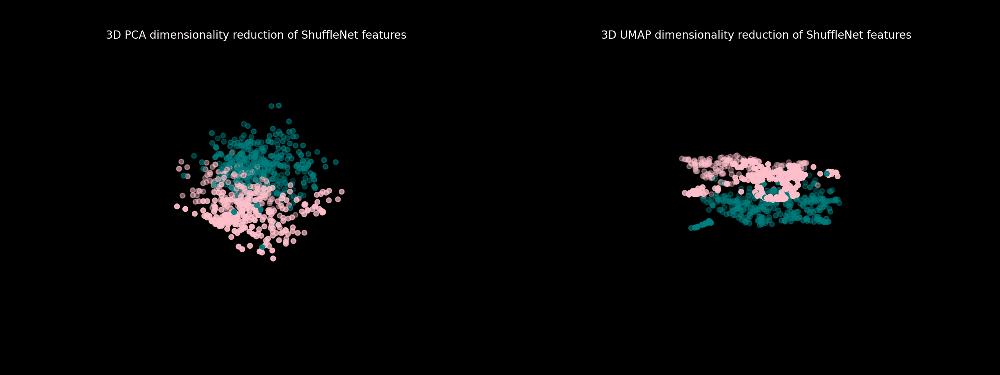

In [ ]:
illustration = illustrate3DFeatures(x_train_d, y_train_d, "ShuffleNet")
illustration.double_gif(animated=True)